# Data Wrangling: HIFLD

Homeland Infrastructure Foundation-Level Data (HIFLD) supports various formats for downloading as well as REST API via ArcGIS Online. This notebook demonstrates how you can access the data on HIFLD through ArcGIS REST API and CyberGISX (Keeling).

## 1. Importing HIFLD data via ArcGIS REST API 

In [1]:
from arcgis import GIS
from arcgis.features import FeatureLayer
import pandas as pd
import geopandas as gpd
import zipfile

In [2]:
gis = GIS() # Log-in to ArcGIS Online 

In [3]:
# Obtain REST API URL from HIFLD website. 
layer = FeatureLayer('https://services1.arcgis.com/Hp6G80Pky0om7QvQ/ArcGIS/rest/services/Power_Plants_gdb/FeatureServer/0')
type(layer)

arcgis.features.layer.FeatureLayer

In [4]:
# With arcgis Python API, we can import the data from ArcGIS Online to (Spatially Enabled) DataFrame
pp_df = pd.DataFrame.spatial.from_layer(layer)
pp_df  # Type: Spatially Enabled Dataframe

,ADDRESS,CAP_FACTOR,CITY,COAL_USED,COUNTRY,COUNTY,COUNTYFIPS,CreationDate,Creator,EditDate,...,SUB_1,SUB_2,SUMMER_CAP,TELEPHONE,TYPE,VAL_DATE,VAL_METHOD,WEBSITE,WINTER_CAP,ZIP
0,COPCO RD 20 MI EAST OF I5,29.000000,HORNBROOK,0,USA,SISKIYOU,06093,2021-12-29 05:49:30.812999964,HostedByHIFLD,2021-12-29 05:49:30.812999964,...,NOT AVAILABLE,NOT AVAILABLE,26.0,NOT AVAILABLE,HYDROELECTRIC PUMPED STORAGE,2015-07-15,OTHER,NOT AVAILABLE,26.0,96044
1,19305 DAGGETT ROAD,27.000000,HORNBROOK,0,USA,SISKIYOU,06093,2021-12-29 05:49:30.812999964,HostedByHIFLD,2021-12-29 05:49:30.812999964,...,COPCO 2,NOT AVAILABLE,36.0,NOT AVAILABLE,HYDROELECTRIC PUMPED STORAGE,2015-07-15,OTHER,NOT AVAILABLE,36.0,96044
2,COPCO RD 9 MI EAST OF I5,52.000000,HORNBROOK,0,USA,SISKIYOU,06093,2021-12-29 05:49:30.812999964,HostedByHIFLD,2021-12-29 05:49:30.812999964,...,NOT AVAILABLE,NOT AVAILABLE,19.0,NOT AVAILABLE,HYDROELECTRIC PUMPED STORAGE,2015-07-15,OTHER,NOT AVAILABLE,19.0,96044
3,10 MI EAST OF HIGHWAY 257,0.414772,MILFORD,0,USA,BEAVER,49001,2021-12-29 05:49:30.812999964,HostedByHIFLD,2021-12-29 05:49:30.812999964,...,BLUNDELL,NOT AVAILABLE,31.7,NOT AVAILABLE,GEOTHERMAL,2017-06-09,IMAGERY/OTHER,NOT AVAILABLE,33.8,84751
4,1338 N 3300 E,0.637485,ASHTON,0,USA,FREMONT,16043,2021-12-29 05:49:30.812999964,HostedByHIFLD,2021-12-29 05:49:30.812999964,...,UNKNOWN204720,NOT AVAILABLE,7.1,NOT AVAILABLE,CONVENTIONAL HYDROELECTRIC,2017-06-09,IMAGERY/OTHER,NOT AVAILABLE,7.1,83420
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10551,31340 RANCHO VISTA RD,-999999.000000,TEMECULA,0,USA,RIVERSIDE,06065,2021-12-29 05:49:30.812999964,HostedByHIFLD,2021-12-29 05:49:30.812999964,...,NOT AVAILABLE,NOT AVAILABLE,-999999.0,NOT AVAILABLE,SOLAR PHOTOVOLTAIC,2018-09-17,IMAGERY/OTHER,NOT AVAILABLE,-999999.0,92592
10552,1444 BORREGAS AVENUE,0.000000,SUNNYVALE,0,USA,SANTA CLARA,06085,2021-12-29 05:49:30.812999964,HostedByHIFLD,2021-12-29 05:49:30.812999964,...,NOT AVAILABLE,NOT AVAILABLE,0.0,NOT AVAILABLE,SOLAR PHOTOVOLTAIC,2018-04-24,OTHER,NOT AVAILABLE,0.0,94089
10553,NOT AVAILABLE,0.000000,UNINCORPORATED,0,USA,FRESNO,06019,2021-12-29 05:49:30.812999964,HostedByHIFLD,2021-12-29 05:49:30.812999964,...,NOT AVAILABLE,NOT AVAILABLE,0.0,NOT AVAILABLE,SOLAR PHOTOVOLTAIC,2018-04-24,OTHER,NOT AVAILABLE,0.0,93616
10554,NOT AVAILABLE,-999999.000000,NOT AVAILABLE,-999999,USA,WESTERN,60050,2021-12-29 05:49:30.812999964,HostedByHIFLD,2021-12-29 05:49:30.812999964,...,NOT AVAILABLE,NOT AVAILABLE,-999999.0,NOT AVAILABLE,NOT AVAILABLE,2019-05-01,IMAGERY,https://www.aspower.com/,-999999.0,NOT AVAILABLE


In [5]:
# The following URL demonstrates how to visualize Spatially Enabled DataFrame, but it does not work on the current CyberGISX environment. 
# Given the initial stage of Spatially Enabled DataFrame, it may not our problem. 
# https://developers.arcgis.com/python/guide/visualizing-data-with-the-spatially-enabled-dataframe/#:~:text=The%20Spatially%20Enabled%20Dataframe%20has,chart%20using%20the%20same%20symbology!
m1 = GIS().map("United States")
m1

MapView(layout=Layout(height='400px', width='100%'))

In [6]:
pp_df.spatial.plot(map_widget= m1)

/data/cigi/cybergisx-easybuild/conda/python3-0.9.0/lib/python3.8/site-packages/arcgis/features/geo/_accessor.py:3150: UserWarning: Discarding nonzero nanoseconds in conversion
  fs = self.__feature_set__
/data/cigi/cybergisx-easybuild/conda/python3-0.9.0/lib/python3.8/site-packages/jupyter_client/session.py:716: UserWarning: Message serialization failed with:
Out of range float values are not JSON compliant
Supporting this message is deprecated in jupyter-client 7, please make sure your message is JSON-compliant
  content = self.pack(content)


True

In [7]:
# Instead, we can plot the data with GeoDataFrame. 
pp_df.columns

Index(['ADDRESS', 'CAP_FACTOR', 'CITY', 'COAL_USED', 'COUNTRY', 'COUNTY',
       'COUNTYFIPS', 'CreationDate', 'Creator', 'EditDate', 'Editor',
       'GEN_UNITS', 'GlobalID', 'LATITUDE', 'LINES', 'LONGITUDE', 'NAICS_CODE',
       'NAICS_DESC', 'NAME', 'NET_GEN', 'NGAS_USED', 'OBJECTID', 'OIL_USED',
       'OPERATOR', 'OPERAT_ID', 'OPER_CAP', 'PLANT_CODE', 'PLAN_CAP',
       'PLAN_UNIT', 'PRIM_FUEL', 'RETIRE_CAP', 'RETIR_UNIT', 'SEC_FUEL',
       'SHAPE', 'SOURCE', 'SOURCEDATE', 'SOURCE_LAT', 'SOURC_LONG', 'STATE',
       'STATUS', 'SUB_1', 'SUB_2', 'SUMMER_CAP', 'TELEPHONE', 'TYPE',
       'VAL_DATE', 'VAL_METHOD', 'WEBSITE', 'WINTER_CAP', 'ZIP'],
      dtype='object')

<AxesSubplot:>

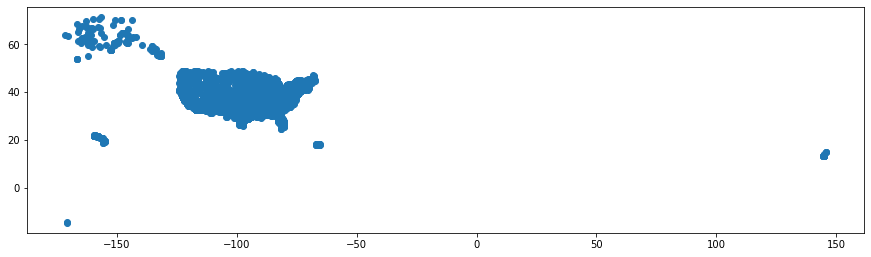

In [8]:
pp_gdf = gpd.GeoDataFrame(pp_df, geometry=gpd.points_from_xy(pp_df.LONGITUDE, pp_df.LATITUDE))
pp_gdf.plot(figsize=(15,5))

## 2. Access via Keeling/CyberGISX

We also downloaded necessary data for I-GUIDe into Keeling/CyberGISX in the following directory. <br>
directory: `/data/cigi/cybergis-jupyter/production_data/notebook_shared_data/data/iguide/agingdam`

In [9]:
import os

In [10]:
os.listdir('/home/jovyan/shared_data/data/iguide/agingdam/HIFLD')

['Ohio Basin', 'US', 'California']

In [11]:
os.listdir('/home/jovyan/shared_data/data/iguide/agingdam/HIFLD/US')

['Intermodal_Freight_Facilities_Air_to_Truck.geojson',
 'Hospitals.geojson',
 'Natural_Gas_Storage_Facilities.geojson',
 'Power_Plants.geojson',
 'Petroleum_Terminals.geojson',
 'FM_Transmission_Towers.geojson',
 'Private_Schools.geojson',
 'Colleges_and_Universities.geojson',
 'Environmental_Protection_Agency_(EPA)_Facility_Registry_Service_(FRS)_Power_Plants.geojson',
 'Private_Non_Retail_Shipping_Facilities.geojson',
 'Local_Law_Enforcement_Locations.geojson',
 'Prison_Boundaries.geojson',
 'Land_Mobile_Broadcast_Towers1.geojson',
 'Emergency_Medical_Service_(EMS)_Stations.geojson',
 'Fire_Stations.geojson',
 'Electric_Substations.geojson',
 'Aircraft_Landing_Facilities.geojson',
 'Public_Schools.geojson',
 'Environmental_Protection_Agency_(EPA)_Facility_Registry_Service_(FRS)_Wastewater_Treatment_Plants.geojson',
 'Railroads.geojson']

<AxesSubplot:>

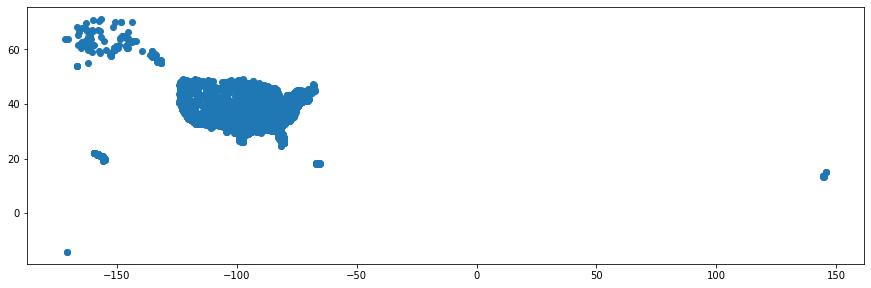

In [12]:
# You can directly import the HIFLD data within CyberGISX environment
pp_gdf_1 = gpd.read_file('/home/jovyan/shared_data/data/iguide/agingdam/HIFLD/US/Power_Plants.geojson')
pp_gdf_1.plot(figsize=(15,5))

## 3. Use case of HIFLD data: risk assssment of aging dam

In [13]:
import networkx as nx
import matplotlib.pyplot as plt
import osmnx as ox
import momepy
from tqdm import tqdm

### 3.1. Load input variables: River, Dams, and Basins

In [14]:
# Data source: https://www.sciencebase.gov/catalog/item/5033c153e4b068b9cdc5475e
study_area = gpd.read_file('./FHP_Ohio_River_Basin_boundary/FHP_Ohio_River_Basin_boundary.shp')
study_area.boundary.explore()

In [15]:
# Data source: https://www.hydrosheds.org/page/hydrorivers

if os.path.exists('./HydroRIVERS_v10_na_shp/HydroRIVERS_v10_na.shp'):
    pass
else:
    with zipfile.ZipFile('./HydroRIVERS_v10_na_shp.zip', 'r') as zip_ref:
        os.mkdir('./HydroRIVERS_v10_na_shp')
        zip_ref.extractall('./')
        

river = gpd.read_file('./HydroRIVERS_v10_na_shp/HydroRIVERS_v10_na.shp')
river = river.loc[(river['MAIN_RIV'] == 70814357) & (river['geometry'].intersects(study_area.at[0, 'geometry']))]
river.head()

,HYRIV_ID,NEXT_DOWN,MAIN_RIV,LENGTH_KM,DIST_DN_KM,DIST_UP_KM,CATCH_SKM,UPLAND_SKM,ENDORHEIC,DIS_AV_CMS,ORD_STRA,ORD_CLAS,ORD_FLOW,HYBAS_L12,geometry
503377,70503378,70503472,70814357,3.49,3660.2,6.8,17.12,17.1,0,0.299,1,4,7,7121046690,"LINESTRING (-78.55417 42.40833, -78.54792 42.4..."
503471,70503472,70504623,70814357,4.82,3655.5,11.6,10.46,42.8,0,0.757,2,3,7,7121046690,"LINESTRING (-78.51875 42.41042, -78.51042 42.4..."
503472,70503473,70504623,70814357,2.70,3655.4,6.3,10.62,10.6,0,0.190,1,4,7,7121046690,"LINESTRING (-78.45417 42.42083, -78.46042 42.4..."
504071,70504072,70504854,70814357,4.39,3586.6,8.0,17.27,17.3,0,0.224,1,6,7,7120482250,"LINESTRING (-79.04375 42.42083, -79.04375 42.4..."
504072,70504073,70504854,70814357,4.21,3586.5,8.7,14.89,14.9,0,0.198,1,5,7,7120482250,"LINESTRING (-79.02917 42.41667, -79.02292 42.4..."


In [16]:
# Data source: https://nid.usace.army.mil/#/
dams = pd.read_csv('./nation.csv', header=1)
dams = gpd.GeoDataFrame(dams, geometry=gpd.points_from_xy(dams.Longitude, dams.Latitude))
dams = dams.loc[(dams['geometry'].within(study_area.at[0, 'geometry'])) & 
                (dams['Hazard Potential Classification'] == 'High') &
                (dams['Owner Types'] == 'Federal')
               ]
dams = dams.reset_index(drop=True)
dams

/data/cigi/cybergisx-easybuild/conda/python3-0.9.0/lib/python3.8/site-packages/IPython/core/interactiveshell.py:3251: DtypeWarning: Columns (12) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)
/data/cigi/cybergisx-easybuild/conda/python3-0.9.0/lib/python3.8/site-packages/pygeos/predicates.py:896: RuntimeWarning: invalid value encountered in within
  return lib.within(a, b, **kwargs)


,Dam Name,Other Names,Former Names,NID ID,Other Structure ID,Federal ID,Owner Names,Owner Types,Primary Owner Type,State or Federal Agency ID,...,Data Last Updated,Last Inspection Date,Inspection Frequency,Hazard Potential Classification,Condition Assessment,Condition Assessment Date,EAP Prepared,EAP Last Revision Date,Website URL,geometry
0,Winona Reservoir,NaN,NaN,KY00260,NaN,KY00260,USDA FS,Federal,Federal,080211 1,...,2021-05-17,2017-11-15,1.0,High,Not Rated,NaN,Yes,NaN,https://www.fs.fed.us/eng/dams/,POINT (-83.80070 37.76202)
1,Greenwood Lake Dam,NaN,NaN,IN03007,NaN,IN03007,DOD USN,Federal,Federal,NFA100000548829,...,2021-12-23,2021-06-29,3.0,High,Fair,2021-06-29,Yes,2018-09-21,https://www.navy.mil/,POINT (-86.87010 38.88550)
2,Indian Lake (Str. #6),NaN,NaN,IN00140,NaN,IN00140,USDA FS,Federal,Federal,091204 77349,...,2021-05-24,2018-12-06,1.0,High,Not Rated,NaN,Yes,NaN,https://www.fs.fed.us/eng/dams/,POINT (-86.65833 38.20833)
3,Bass Lake Dam,NaN,Cone Lake Dam,NC00251,NaN,NC00251,DOI NPS,Federal,Federal,NaN,...,2018-11-02,2005-02-17,0.0,High,Not Available,NaN,Yes,2014-01-15,https://www.nps.gov/index.htm,POINT (-81.68333 36.14167)
4,Old Timbers Lake,Old Timbers Lake,Old Timbers Lake Dam,IN03556,NaN,IN03556,Jefferson Proving Ground,Federal,Federal,NaN,...,2021-05-04,2017-10-06,4.0,High,Not Available,NaN,Yes,2005-01-01,https://www.army.mil/,POINT (-85.40000 39.02833)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
104,Pleasant Hill Dam,Pleasant Hill Lake,NaN,OH00001,NaN,OH00001,USACE - Huntington District,Federal,Federal,NaN,...,2022-02-14,2020-08-28,5.0,High,Not Available,NaN,Yes,2018-01-30,NaN,POINT (-82.32452 40.62294)
105,J. Edward Roush Dam,J. Edward Roush Lake,Huntington Lake Dam,IN03006,NaN,IN03006,USACE - Chicago District,Federal,Federal,NaN,...,2022-02-14,2019-06-07,5.0,High,Not Available,NaN,Yes,2019-09-05,NaN,POINT (-85.46868 40.84601)
106,Mississinewa Dam,Mississinewa Lake,NaN,IN03004,NaN,IN03004,USACE - Chicago District,Federal,Federal,NaN,...,2022-02-14,2019-07-31,5.0,High,Not Available,NaN,Yes,2019-09-05,NaN,POINT (-85.95814 40.71550)
107,Salamonie Dam,NaN,NaN,IN03005,NaN,IN03005,USACE - Chicago District,Federal,Federal,NaN,...,2022-02-14,2019-08-09,5.0,High,Not Available,NaN,Yes,2019-09-05,NaN,POINT (-85.67793 40.80792)


In [17]:
# Data source: https://www.hydrosheds.org/page/hydrobasins
basin = gpd.read_file('./hybas_na_lev08_v1c/hybas_na_lev08_v1c.shp')
basin = basin.loc[basin['geometry'].intersects(study_area.at[0, 'geometry'])]
basin.boundary.explore()

### 3.2. Overlay input variables

<AxesSubplot:>

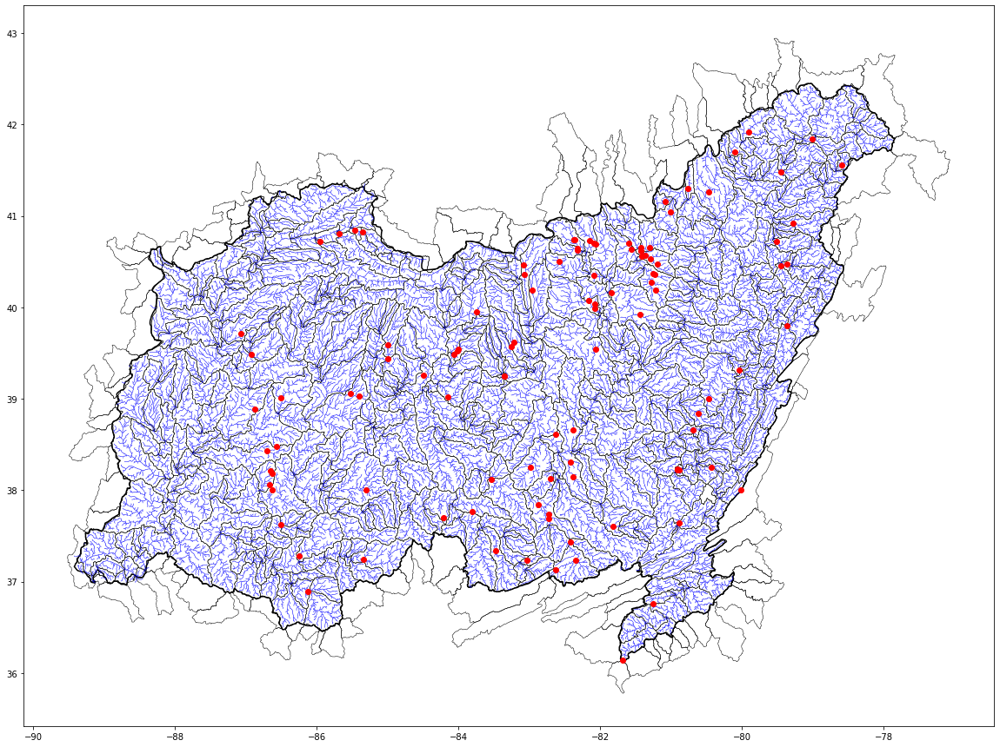

In [18]:
fig, ax = plt.subplots(figsize=(20,20))

dams.plot(ax=ax, color='red', zorder=2)
study_area.boundary.plot(ax=ax, color='black', zorder=1)
basin.boundary.plot(ax=ax, lw=0.5, color='black', zorder=1)
river.plot(ax=ax, lw=0.5, color='blue', zorder=1)

### 3.3. Construct river network with Memopy

In [19]:
G = momepy.gdf_to_nx(river, approach='primal', directed=True)

for i, data in G.nodes(data=True):
    data['x'] = i[0]
    data['y'] = i[1]

mapping = dict(zip(G, [f'N{i}' for i in range(len(G.nodes))]))
G = nx.relabel_nodes(G, mapping)

for u, v, k, data in G.edges(data=True, keys=True):
    data['length'] = data['geometry'].length

/data/cigi/cybergisx-easybuild/conda/python3-0.9.0/lib/python3.8/site-packages/momepy/utils.py:235: UserWarning: Geometry is in a geographic CRS. Results from 'length' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  gdf_network[length] = gdf_network.geometry.length


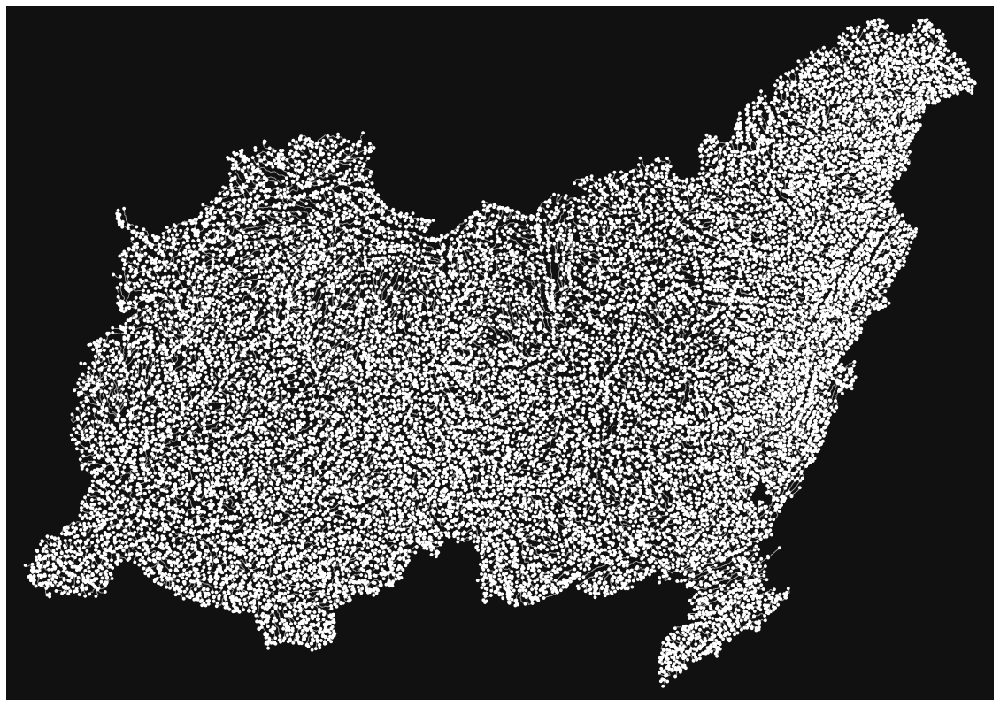

(<Figure size 1440x1440 with 1 Axes>, <AxesSubplot:>)

In [20]:
ox.plot_graph(G, figsize=(20, 20))

In [21]:
# This function helps you to find the nearest network node from a given GeoDataFrame
# If geom type is point, it will take it without modification, but 
# IF geom type is polygon or multipolygon, it will take its centroid to calculate the nearest element. 

def find_nearest_network_nodes(network, gdf):
    for idx, row in tqdm(gdf.iterrows(), total=gdf.shape[0]):
        if row.geometry.geom_type == 'Point':
            nearest_node = ox.distance.nearest_nodes(network, 
                                                    X=row.geometry.x, 
                                                    Y=row.geometry.y
                                                   )
        elif row.geometry.geom_type == 'Polygon' or row.geometry.geom_type == 'MultiPolygon':
            nearest_node = ox.distance.nearest_nodes(network, 
                                        X=row.geometry.centroid.x, 
                                        Y=row.geometry.centroid.y
                                       )
        else:
            print(row.geometry.geom_type)
            continue

        gdf.at[idx, 'nearest_node'] = nearest_node

    return gdf

dams = find_nearest_network_nodes(G, dams)
dams.head()

100%|██████████| 109/109 [00:12<00:00,  8.51it/s]


,Dam Name,Other Names,Former Names,NID ID,Other Structure ID,Federal ID,Owner Names,Owner Types,Primary Owner Type,State or Federal Agency ID,...,Last Inspection Date,Inspection Frequency,Hazard Potential Classification,Condition Assessment,Condition Assessment Date,EAP Prepared,EAP Last Revision Date,Website URL,geometry,nearest_node
0,Winona Reservoir,NaN,NaN,KY00260,NaN,KY00260,USDA FS,Federal,Federal,080211 1,...,2017-11-15,1.0,High,Not Rated,NaN,Yes,NaN,https://www.fs.fed.us/eng/dams/,POINT (-83.80070 37.76202),N19139
1,Greenwood Lake Dam,NaN,NaN,IN03007,NaN,IN03007,DOD USN,Federal,Federal,NFA100000548829,...,2021-06-29,3.0,High,Fair,2021-06-29,Yes,2018-09-21,https://www.navy.mil/,POINT (-86.87010 38.88550),N13162
2,Indian Lake (Str. #6),NaN,NaN,IN00140,NaN,IN00140,USDA FS,Federal,Federal,091204 77349,...,2018-12-06,1.0,High,Not Rated,NaN,Yes,NaN,https://www.fs.fed.us/eng/dams/,POINT (-86.65833 38.20833),N16929
3,Bass Lake Dam,NaN,Cone Lake Dam,NC00251,NaN,NC00251,DOI NPS,Federal,Federal,NaN,...,2005-02-17,0.0,High,Not Available,NaN,Yes,2014-01-15,https://www.nps.gov/index.htm,POINT (-81.68333 36.14167),N23964
4,Old Timbers Lake,Old Timbers Lake,Old Timbers Lake Dam,IN03556,NaN,IN03556,Jefferson Proving Ground,Federal,Federal,NaN,...,2017-10-06,4.0,High,Not Available,NaN,Yes,2005-01-01,https://www.army.mil/,POINT (-85.40000 39.02833),N12420


### Dam failure scenario: Mississinewa Dam, Miami County, Indiana

In [22]:
dams.loc[dams['Dam Name'] == 'Mississinewa Dam']

,Dam Name,Other Names,Former Names,NID ID,Other Structure ID,Federal ID,Owner Names,Owner Types,Primary Owner Type,State or Federal Agency ID,...,Last Inspection Date,Inspection Frequency,Hazard Potential Classification,Condition Assessment,Condition Assessment Date,EAP Prepared,EAP Last Revision Date,Website URL,geometry,nearest_node
106,Mississinewa Dam,Mississinewa Lake,NaN,IN03004,NaN,IN03004,USACE - Chicago District,Federal,Federal,NaN,...,2019-07-31,5.0,High,Not Available,NaN,Yes,2019-09-05,NaN,POINT (-85.95814 40.71550),N3272


In [23]:
temp_catchment = nx.single_source_dijkstra_path_length(G, dams.at[106, 'nearest_node'])
temp_catchment

{'N3272': 0,
 'N3221': 1,
 'N3220': 2,
 'N3219': 3,
 'N3235': 4,
 'N3256': 5,
 'N3289': 6,
 'N3270': 7,
 'N3288': 8,
 'N3287': 9,
 'N3253': 10,
 'N3252': 11,
 'N3286': 12,
 'N3268': 13,
 'N3267': 14,
 'N3285': 15,
 'N3425': 16,
 'N3453': 17,
 'N3482': 18,
 'N3569': 19,
 'N3603': 20,
 'N3772': 21,
 'N3899': 22,
 'N3956': 23,
 'N4019': 24,
 'N4073': 25,
 'N4233': 26,
 'N4263': 27,
 'N4447': 28,
 'N4475': 29,
 'N4446': 30,
 'N4864': 31,
 'N4832': 32,
 'N4863': 33,
 'N4806': 34,
 'N4775': 35,
 'N4991': 36,
 'N5007': 37,
 'N5070': 38,
 'N5155': 39,
 'N5218': 40,
 'N5219': 41,
 'N5260': 42,
 'N5331': 43,
 'N5406': 44,
 'N5514': 45,
 'N5631': 46,
 'N5814': 47,
 'N5830': 48,
 'N5918': 49,
 'N5961': 50,
 'N6001': 51,
 'N6131': 52,
 'N6151': 53,
 'N6344': 54,
 'N6550': 55,
 'N6885': 56,
 'N6964': 57,
 'N7220': 58,
 'N7299': 59,
 'N7353': 60,
 'N7579': 61,
 'N7712': 62,
 'N7826': 63,
 'N8232': 64,
 'N8247': 65,
 'N8296': 66,
 'N8523': 67,
 'N8727': 68,
 'N8810': 69,
 'N9150': 70,
 'N9208': 71,
 '

In [24]:
nodes, edges = ox.graph_to_gdfs(G, nodes=True, edges=True, node_geometry=True)
ctmt_edges = edges.loc[edges.index.get_level_values('u').isin(temp_catchment.keys())]
ctmt_basin = basin.loc[basin['geometry'].intersects(ctmt_edges.geometry.unary_union)]
ctmt_basin.head()

,HYBAS_ID,NEXT_DOWN,NEXT_SINK,MAIN_BAS,DIST_SINK,DIST_MAIN,SUB_AREA,UP_AREA,PFAF_ID,ENDO,COAST,ORDER,SORT,geometry
13729,7080612640,7080613800,7080047060,7080047060,1586.0,1586.0,6.2,527761.3,74261001,0,0,2,13730,"POLYGON ((-89.13333 36.98333, -89.14167 36.983..."
13731,7080612370,7080612640,7080047060,7080047060,1589.2,1589.2,28.8,527618.8,74261003,0,0,2,13732,"POLYGON ((-89.16250 36.99167, -89.16492 36.992..."
13741,7080610750,7080612370,7080047060,7080047060,1597.6,1597.6,122.7,525821.0,74261005,0,0,2,13742,"POLYGON ((-89.13750 37.05000, -89.14409 37.050..."
13745,7080608920,7080610750,7080047060,7080047060,1609.6,1609.6,455.3,525487.7,74261007,0,0,2,13746,"POLYGON ((-88.89167 37.09583, -88.89804 37.095..."
13776,7080609290,7080608920,7080047060,7080047060,1652.6,1652.6,403.0,524856.5,74261009,0,0,2,13777,"POLYGON ((-88.67083 37.03333, -88.68554 37.033..."


<AxesSubplot:>

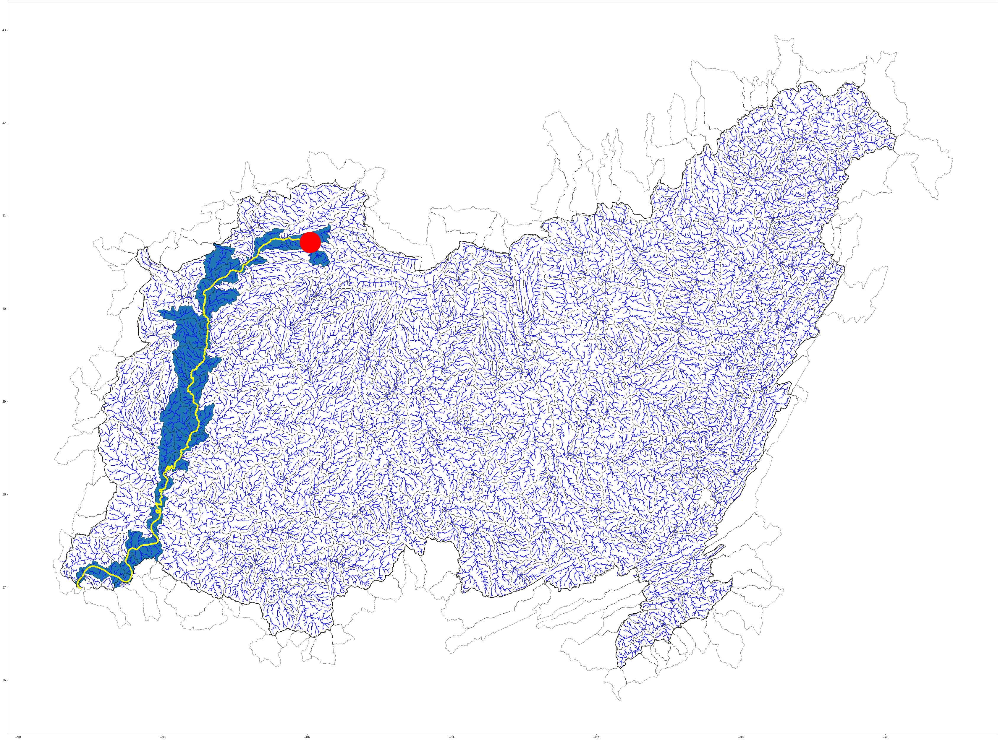

In [25]:
fig, ax = plt.subplots(figsize=(60,60))

dams.loc[dams['Dam Name'] == 'Mississinewa Dam'].plot(ax=ax, color='red', markersize=5000, zorder=5)
study_area.boundary.plot(ax=ax, color='black', zorder=1)
basin.boundary.plot(ax=ax, lw=0.5, color='black', zorder=1)
river.plot(ax=ax, color='blue', zorder=1)

ctmt_edges.plot(ax=ax, color='yellow', lw=5, zorder=2)
ctmt_basin.plot(ax=ax, zorder=0)

In [26]:
pp_in_ctmt_area = pp_gdf_1.loc[pp_gdf_1.geometry.within(ctmt_basin.geometry.unary_union)]
pp_in_ctmt_area.head()

,OBJECTID,PLANT_CODE,NAME,ADDRESS,CITY,STATE,ZIP,TELEPHONE,TYPE,STATUS,...,SUB_2,LINES,SOURCE_LAT,SOURC_LONG,GlobalID,CreationDate,Creator,EditDate,Editor,geometry
169,2170,6113,GIBSON,R 1 BOX 300,OWENSVILLE,IN,47665,(800) 521-2232,CONVENTIONAL STEAM COAL,OP,...,NOT AVAILABLE,1,38.372222,-87.765833,82bd065f-dc58-4a0c-87fa-ea69e2211ea6,2021-12-29T05:49:30.813000+00:00,HostedByHIFLD,2021-12-29T05:49:30.813000+00:00,HostedByHIFLD,POINT (-87.76583 38.37222)
237,2238,6213,MEROM,5500 W. OLD 54,SULLIVAN,IN,47882,(812) 356-4291,CONVENTIONAL STEAM COAL,OP,...,NOT AVAILABLE,1,39.069400,-87.510800,ac5b9023-0f5f-454c-b38a-3eac6762b2d5,2021-12-29T05:49:30.813000+00:00,HostedByHIFLD,2021-12-29T05:49:30.813000+00:00,HostedByHIFLD,POINT (-87.51116 39.06916)
746,2747,7858,MEPI GT FACILITY,2200 PORTLAND ROAD,JOPPA,IL,62953,NOT AVAILABLE,NATURAL GAS FIRED COMBUSTION TURBINE,OP,...,NOT AVAILABLE,1,37.217500,-88.866100,9c955c4f-08d1-44fd-8f65-f467cd75daf9,2021-12-29T05:49:30.813000+00:00,HostedByHIFLD,2021-12-29T05:49:30.813000+00:00,HostedByHIFLD,POINT (-88.86622 37.21800)
1501,3502,50240,PURDUE UNIVERSITY,401 SOUTH GRANT STREET,WEST LAFAYETTE,IN,47907,(765) 494-5693,NATURAL GAS STEAM TURBINE; PETROLEUM LIQUIDS,OP,...,NOT AVAILABLE,1,40.417200,-86.912200,30368cbc-ad47-42ec-8819-e2d13096233f,2021-12-29T05:49:30.813000+00:00,HostedByHIFLD,2021-12-29T05:49:30.813000+00:00,HostedByHIFLD,POINT (-86.91220 40.41720)
1836,3837,50903,SAGAMORE PLANT COGENERATION,2245 SAGAMORC PARKWAY NORTH,LAFAYETTE,IN,47904,(765) 448-7123,NATURAL GAS STEAM TURBINE,OP,...,NOT AVAILABLE,1,40.443900,-86.860000,f116dfc6-9b73-4212-924d-3c09d3bb6397,2021-12-29T05:49:30.813000+00:00,HostedByHIFLD,2021-12-29T05:49:30.813000+00:00,HostedByHIFLD,POINT (-86.86009 40.44342)


In [27]:
m = ctmt_edges.explore(color='blue')

dams.loc[dams['Dam Name'] == 'Mississinewa Dam'].explore(m=m, color='red')
ctmt_basin.boundary.explore(m=m, color='black')
pp_in_ctmt_area.explore(m=m, color='yellow')